# Damage Size Regression on Real-world Data
In this notebook, we conduct experiments on real-world data with models trained on solely synthetic data.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/berni-lehner/structural_health_monitoring/blob/main/notebooks/mixed_regression_AB.ipynb)

In [1]:
%load_ext rich
%load_ext autoreload
%autoreload 2
%matplotlib inline

from rich import print

random_state = 42

## Prerequisites

In [2]:
import sys
import os
from pathlib import Path
import pandas as pd
import multiprocessing

multiprocessing.set_start_method("spawn")

# initialize environment, paths, etc...
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB:
    # uncomment in case you want to start from scratch in Colab
    !rm -rf /content/structural_health_monitoring  
    !git clone https://github.com/berni-lehner/structural_health_monitoring.git
    % pip install -r /content/structural_health_monitoring/requirements.txt

    # this is Colab specific, and only a manual "Run all" will cause the
    # installation to be finished
    if pd.__version__ != "1.4.2":
        print("Stopping RUNTIME! Please run again to finish installation.")
        os.kill(os.getpid(), 9)

    DATA_PATH = Path(r"/content/structural_health_monitoring/data")
    sys.path.insert(0, "/content/structural_health_monitoring/src")
else:
    DATA_PATH = Path(r"../data/")
    sys.path.insert(0, "../src")


sys.path.insert(0, DATA_PATH)
SYN_DATA_PATH = Path(DATA_PATH, "synthetic")
REAL_DATA_PATH = Path(DATA_PATH, "real_world")
RESULT_PATH = Path(DATA_PATH, "results")
if not os.path.isdir(RESULT_PATH):
    os.makedirs(RESULT_PATH)

try:
    from zippeekiyay import namelist
except ImportError or ModuleNotFoundError:
    print("installing zippee-ki-yay...")
    % pip install git+https://github.com/berni-lehner/zippee-ki-yay.git

    from zippeekiyay import namelist

CALIBRATION_FILE = Path(REAL_DATA_PATH, "calibration.pkl")

In [3]:
# Intel(R) Extension for Scikit-learn for speed-up
from sklearnex import patch_sklearn

patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [4]:
import time
import glob
import sklearn
import numpy as np
from collections import Counter

import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as widgets

# ...and download raw data if not already downloaded
from data_utils import init_data

init_data(syn_data_path=SYN_DATA_PATH, real_data_path=REAL_DATA_PATH)

from plot_utils import (
    init_plotting,
    plot_metrics,
    plot_cv_indices,
    plot_embedding_targets,
    init_plotting,
    plot_classwise_dist,
    plot_classwise_kde,
)

# configure fonts, etc...
init_plotting()

from scoring_utils import get_real_regression_scoring, SHM_Scoring
from cv_utils import (
    AnomalyShuffleSplit,
    RepeatedAnomalyShuffleSplit,
    CreateAnomalyData,
    dump_cv,
)
from bench_utils import classification_benchmark, repeat_experiment, extract_metrics
from data_utils import load_processed_data, load_syn_reg_data, FEATURE_LIST
from shm_experiments import conduct_ab_mixed_reg_experiment

time passed: 10.06 s
downloading synthetic data successful: True
time passed: 2.44 s
downloading real world data successful: True


In [5]:
result_file = "30_mixed_regression_AB_featsel.pkl"
result_file = Path(RESULT_PATH, result_file)

## Data Loading

### Synthetic Data

In [6]:
Xsyn, ysyn = load_syn_reg_data(data_path=SYN_DATA_PATH, min_radius=1.9, cache=True)

In [7]:
Xsyn.shape

(28302, 31)

In [8]:
ctr = Counter(ysyn)
ctr


Counter({
    0.0: 990,
    2.2: 979,
    2.5: 979,
    2.8: 978,
    3.1: 986,
    3.4: 972,
    3.8: 973,
    4.1: 976,
    4.4: 979,
    4.7: 976,
    5.0: 977,
    6.7: 981,
    8.3: 972,
    10.0: 973,
    12.0: 969,
    14.0: 978,
    16.0: 980,
    18.0: 976,
    20.0: 974,
    22.0: 975,
    24.0: 980,
    26.0: 973,
    28.0: 983,
    30.0: 977,
    32.0: 967,
    34.0: 971,
    36.0: 976,
    38.0: 964,
    40.0: 968
})

### Real World Data

In [9]:
Xreal, yreal = load_syn_reg_data(
    data_path=REAL_DATA_PATH,
    min_radius=1.0,
    synthetic=False,
    calibration_file=CALIBRATION_FILE,
)

In [10]:
Xreal.shape

(225, 31)

In [11]:
ctr = Counter(yreal)
ctr


Counter({
    0.0: 9,
    1.5: 9,
    10.0: 9,
    12.0: 9,
    14.0: 9,
    16.0: 9,
    17.0: 9,
    19.0: 9,
    2.5: 9,
    21.0: 9,
    23.0: 9,
    25.0: 9,
    27.0: 9,
    29.0: 9,
    3.5: 9,
    31.0: 9,
    33.0: 9,
    35.0: 9,
    37.0: 9,
    39.0: 9,
    4.5: 9,
    40.0: 9,
    5.5: 9,
    7.0: 9,
    8.0: 9
})

In [12]:
normal_real_indices = yreal == 0.0
normal_syn_indices = ysyn == 0.0
X = np.concatenate([Xreal[normal_real_indices], Xsyn[normal_syn_indices]], axis=0)
y = np.concatenate(
    [
        np.repeat("real", np.sum(normal_real_indices)),
        np.repeat("synthetic", np.sum(normal_syn_indices)),
    ]
)

target_col = "origin"

df_X = pd.DataFrame(X)

df_y = pd.DataFrame(columns=[target_col])
df_y[target_col] = y

df = pd.concat([df_X, df_y], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       999 non-null    float32
 1   1       999 non-null    float32
 2   2       999 non-null    float32
 3   3       999 non-null    float32
 4   4       999 non-null    float32
 5   5       999 non-null    float32
 6   6       999 non-null    float32
 7   7       999 non-null    float32
 8   8       999 non-null    float32
 9   9       999 non-null    float32
 10  10      999 non-null    float32
 11  11      999 non-null    float32
 12  12      999 non-null    float32
 13  13      999 non-null    float32
 14  14      999 non-null    float32
 15  15      999 non-null    float32
 16  16      999 non-null    float32
 17  17      999 non-null    float32
 18  18      999 non-null    float32
 19  19      999 non-null    float32
 20  20      999 non-null    float32
 21  21      999 non-null    float32
 22  22

In [13]:
ctr = Counter(df[target_col])
ctr

Counter({'real': 9, 'synthetic': 990})

## Calibration check
We plot the mean and standard deviation of only pristine samples of synthetic and real-world data.

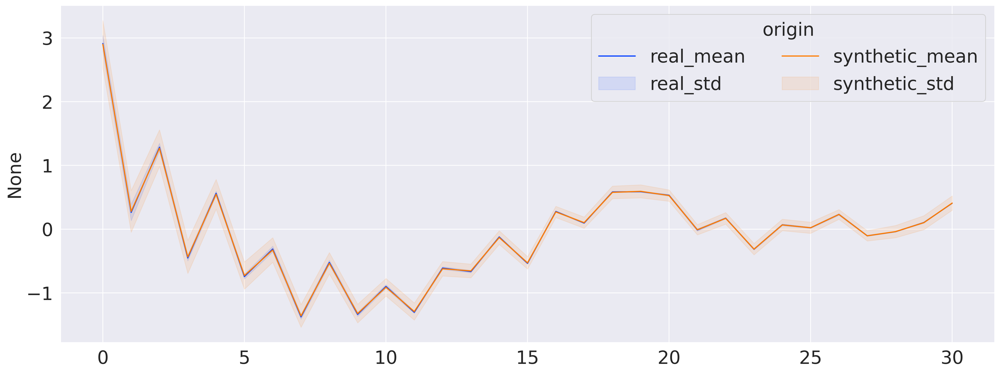

In [14]:
from plot_utils import plot_classwise_dist

fig = plot_classwise_dist(df=df, label_col=target_col)
fig.gca().legend(ncol=2, loc="best", title=target_col)

## A-B Experiments

In [15]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.feature_selection import (
    SelectKBest,
    f_regression,
    r_regression,
    mutual_info_regression,
)

from sklearn.preprocessing import FunctionTransformer
from imblearn.under_sampling import ClusterCentroids
from imblearn.pipeline import Pipeline

from pipe_utils import build_pipeline, build_sampled_pipeline

In [16]:
samples_per_class = 2

# Feature Seletion

In [17]:
classes, counts = np.unique(y, return_counts=True)
n_classes = len(classes)
strgy = dict(zip(range(n_classes), [samples_per_class] * n_classes))

sampler = ClusterCentroids(
    estimator=KMeans(n_init="auto"),
    sampling_strategy=strgy,
    random_state=random_state,
)

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"BASE", build_pipeline())],
    [(f"ClusterCentroids", build_sampled_pipeline(sampler, estimator))],
]

m_reg = ("Mutual_information", mutual_info_regression, [4, 5, 6])
f_reg = ("F-statistic", f_regression, [10, 11, 12])
r_reg = ("Pearson's_r-value", r_regression, [25, 26, 27])

for name, scorer, npt in [
    m_reg,
    f_reg,
    r_reg,
]:
    for k in npt:
        estimator = KNeighborsRegressor(n_neighbors=1)
        fs = SelectKBest(score_func=scorer, k=k)

        pipeline = Pipeline([("featsel", fs), ("estimator", estimator)], verbose=False)
        models.append([(f"{name}_{k}-best", pipeline)])

In [18]:
scoring = get_real_regression_scoring()

start_time = time.perf_counter()
results = conduct_ab_mixed_reg_experiment(
    Xsyn=Xsyn,
    ysyn=ysyn,
    Xreal=Xreal,
    yreal=yreal,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)
end_time = time.perf_counter()
print(f"time passed: {end_time-start_time:.2f} s")

time passed: 116.86 s

## Store results for later

In [19]:
results.to_pickle(result_file)

## Plot some results for overview

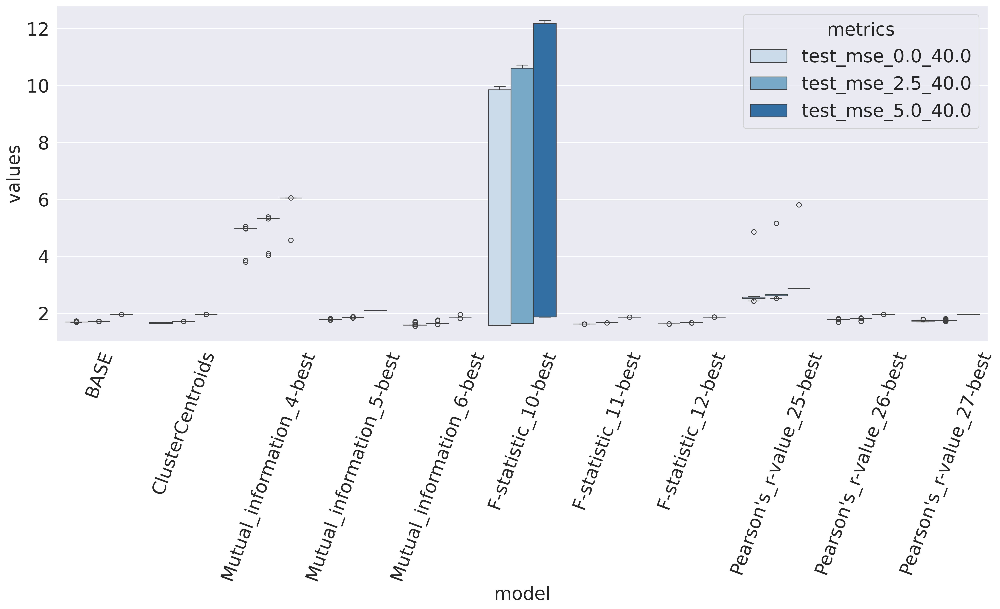

In [20]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.5_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()

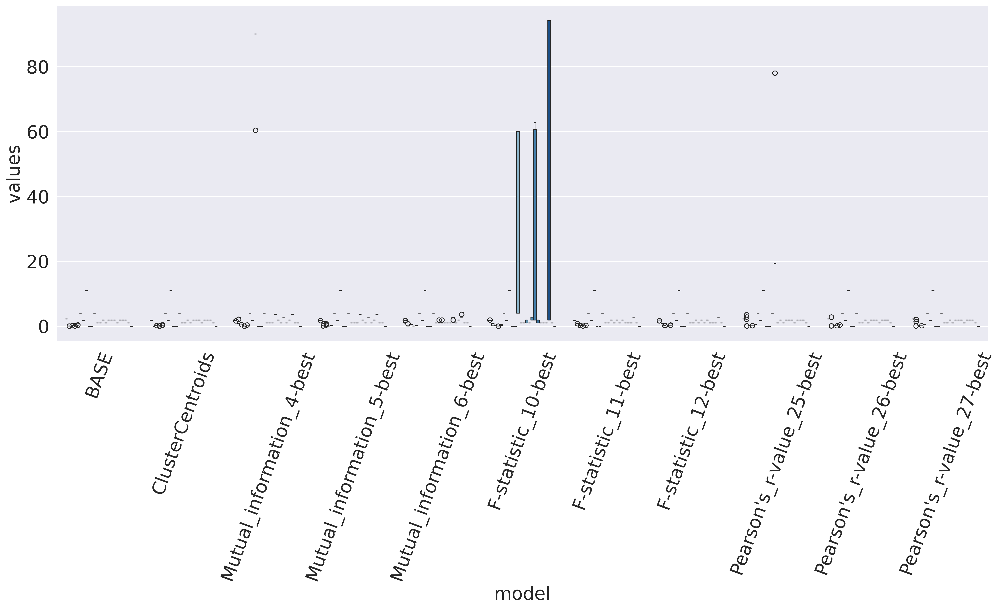

In [21]:
shm_scoring = SHM_Scoring()

fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_MSE_RESULTS))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

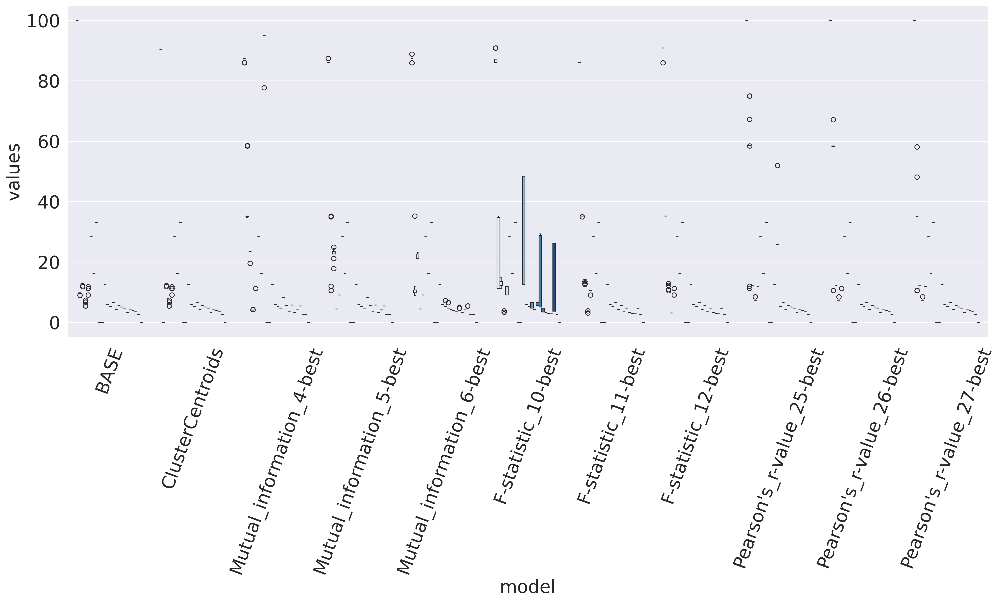

In [22]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_REL_ERROR))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

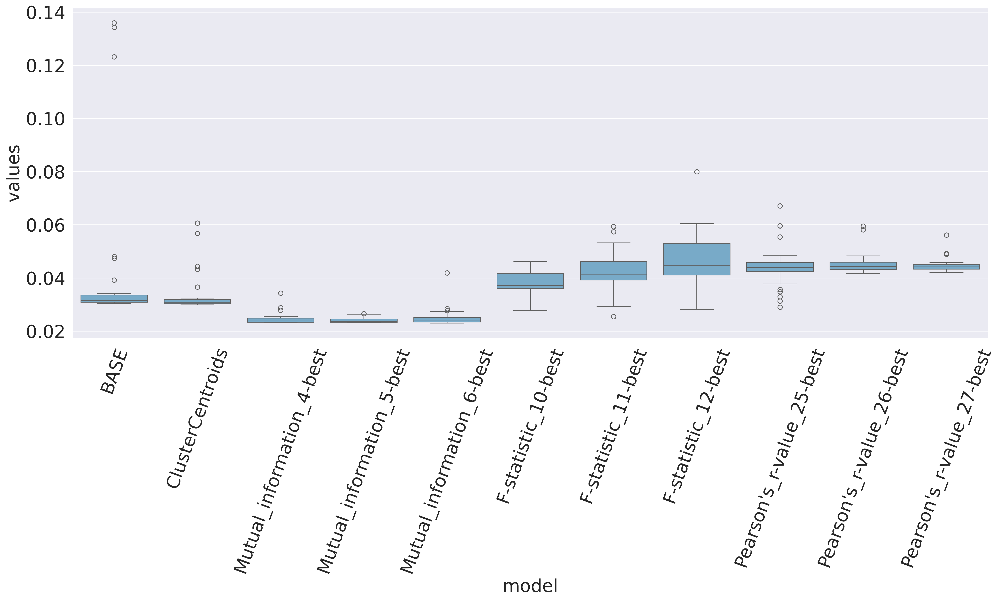

In [23]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

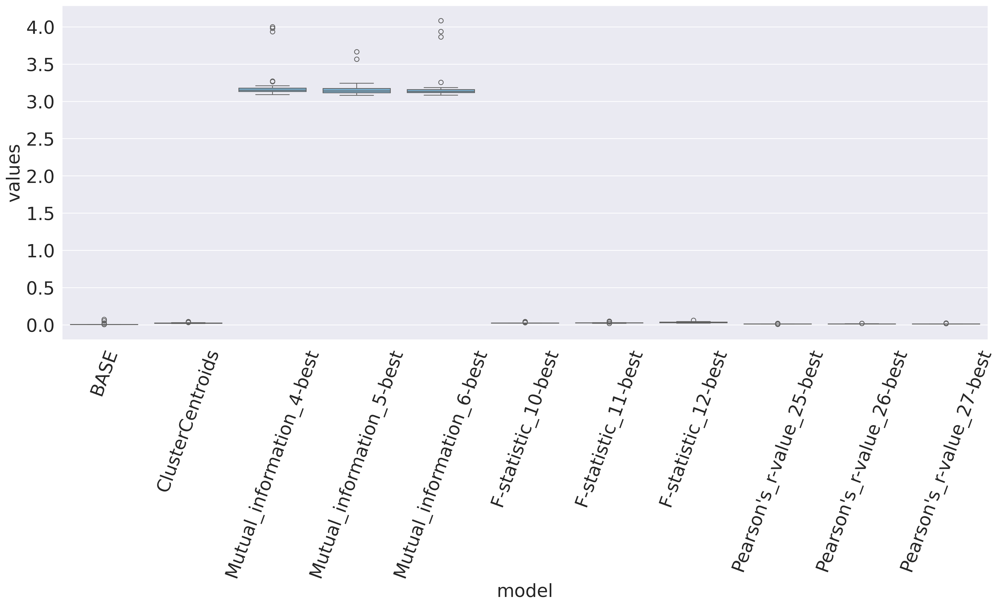

In [24]:
fig = plot_metrics(extract_metrics(results, ["fit_time"]))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

In [25]:
from plot_utils import get_metrics_summary

get_metrics_summary(extract_metrics(results, ["score_time"]))

,,mean,std
model,metrics,,
BASE,score_time,0.042081,0.029462
ClusterCentroids,score_time,0.03357,0.007426
F-statistic_10-best,score_time,0.038554,0.004059
F-statistic_11-best,score_time,0.042536,0.007763
F-statistic_12-best,score_time,0.046951,0.009641
Mutual_information_4-best,score_time,0.024563,0.002207
Mutual_information_5-best,score_time,0.024094,0.000991
Mutual_information_6-best,score_time,0.025038,0.003398
Pearson's_r-value_25-best,score_time,0.044316,0.007877


In [26]:
 ~results.iloc[350]["estimator"]["featsel"].get_support()
# results["estimator"]
dict(results.iloc[350]["estimator"].steps)


{
    'featsel': SelectKBest(k=27, score_func=<function r_regression at 0x7f3364113b80>),
    'estimator': KNeighborsRegressor(n_neighbors=1)
}

In [27]:
def debug_print(row):
    if "featsel" in dict(row["estimator"].steps):
        print(row["model"], np.argwhere(row["estimator"]["featsel"].get_support()).flatten())


results.apply(debug_print, axis=1);

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_4-best [1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_5-best [0 1 2 3 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 4 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 4 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 4 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 4 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 4 6]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

Mutual_information_6-best [0 1 2 3 6 7]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  3  4  5 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_10-best [ 0  1  2  3  4 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_11-best [ 0  1  2  3  4  5 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

F-statistic_12-best [ 0  1  2  3  4  5  8 10 11 23 26 27]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_25-best [ 1  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28 29
 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_26-best [ 1  2  3  5  6  7  8  9 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26 28
 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

Pearson's_r-value_27-best [ 1  2  3  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25 26
 28 29 30]

# Feature Selection + ClusterCentroids

In [28]:
result_file = "30_mixed_regression_AB_featsel_cc.pkl"
result_file = Path(RESULT_PATH, result_file)

In [29]:
from sklearn.preprocessing import OrdinalEncoder
from imblearn.base import FunctionSampler
from pipe_utils import resampling

classes, counts = np.unique(y, return_counts=True)
n_classes = len(classes)
strgy = dict(zip(range(n_classes), [samples_per_class] * n_classes))

sampler = ClusterCentroids(
    estimator=KMeans(n_init="auto"),
    sampling_strategy=strgy,
    random_state=random_state,
)

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"BASE", build_pipeline())],
    [(f"ClusterCentroids", build_sampled_pipeline(sampler, estimator))],
]

m_reg = ("Mutual_information", mutual_info_regression, [4, 5, 6])
f_reg = ("F-statistic", f_regression, [10, 11, 12])
r_reg = ("Pearson's_r-value", r_regression, [25, 26, 27])

for name, scorer, npt in [
    m_reg,
    f_reg,
    r_reg,
]:
    for k in npt:
        fs = SelectKBest(score_func=scorer, k=k)

        sampler = ClusterCentroids(
            estimator=KMeans(n_init="auto"),
            sampling_strategy=strgy,
            random_state=random_state,
        )

        estimator = KNeighborsRegressor(n_neighbors=1)

        pipeline = Pipeline(
            [
                ("featsel", fs),
                (
                    "sampler",
                    FunctionSampler(
                        func=resampling, kw_args=dict(sampler=sampler), validate=False
                    ),
                ),
                ("estimator", estimator),
            ],
            verbose=False,
        )
        models.append([(f"{name}_{k}-best", pipeline)])

In [30]:
scoring = get_real_regression_scoring()

start_time = time.perf_counter()
results = conduct_ab_mixed_reg_experiment(
    Xsyn=Xsyn,
    ysyn=ysyn,
    Xreal=Xreal,
    yreal=yreal,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)
end_time = time.perf_counter()
print(f"time passed: {end_time-start_time:.2f} s")

time passed: 116.02 s

## Store results for later

In [31]:
results.to_pickle(result_file)

## Plot some results for overview

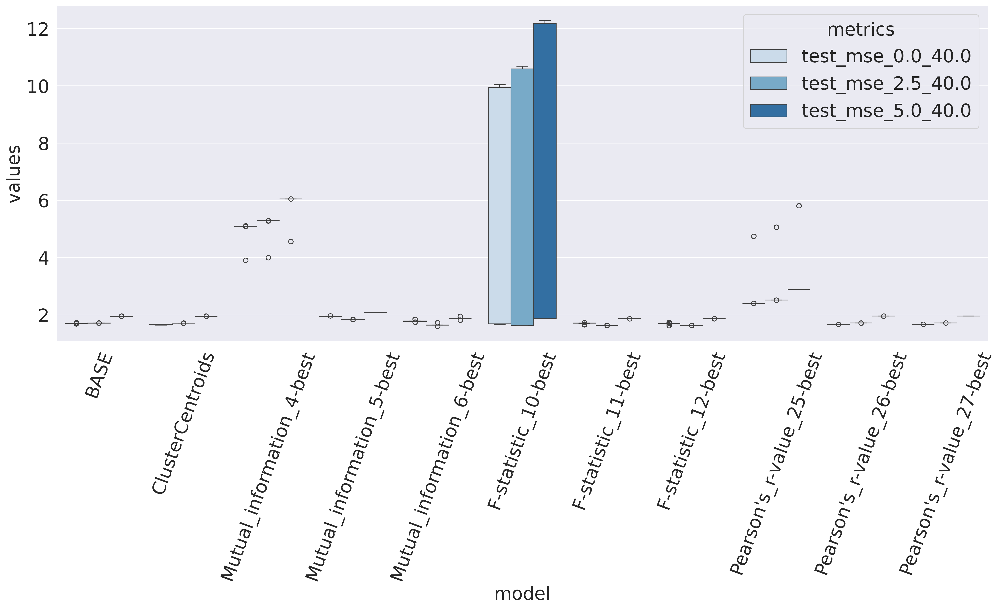

In [32]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.5_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()
shm_scoring = SHM_Scoring()

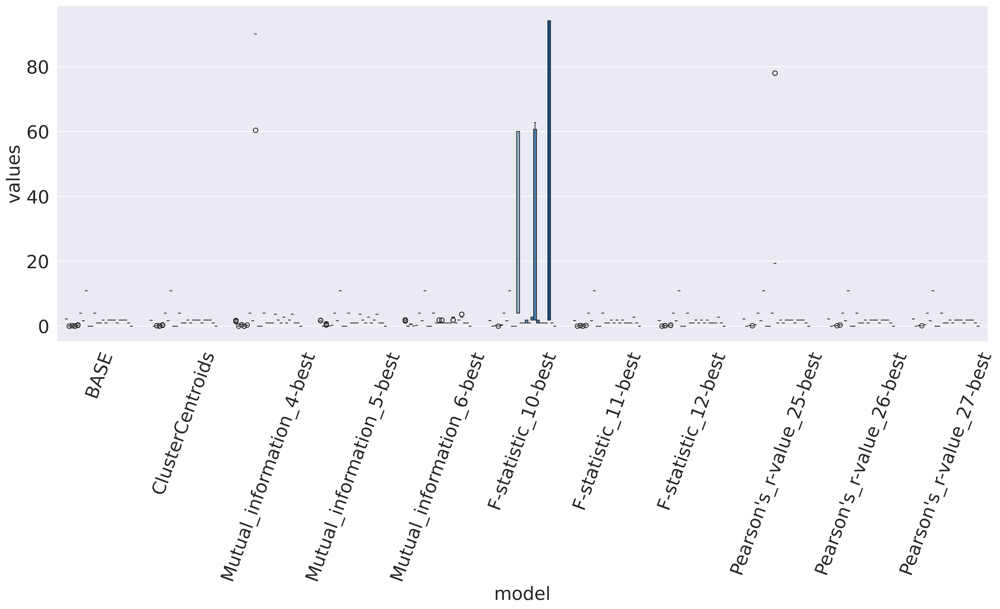

In [33]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_MSE_RESULTS))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

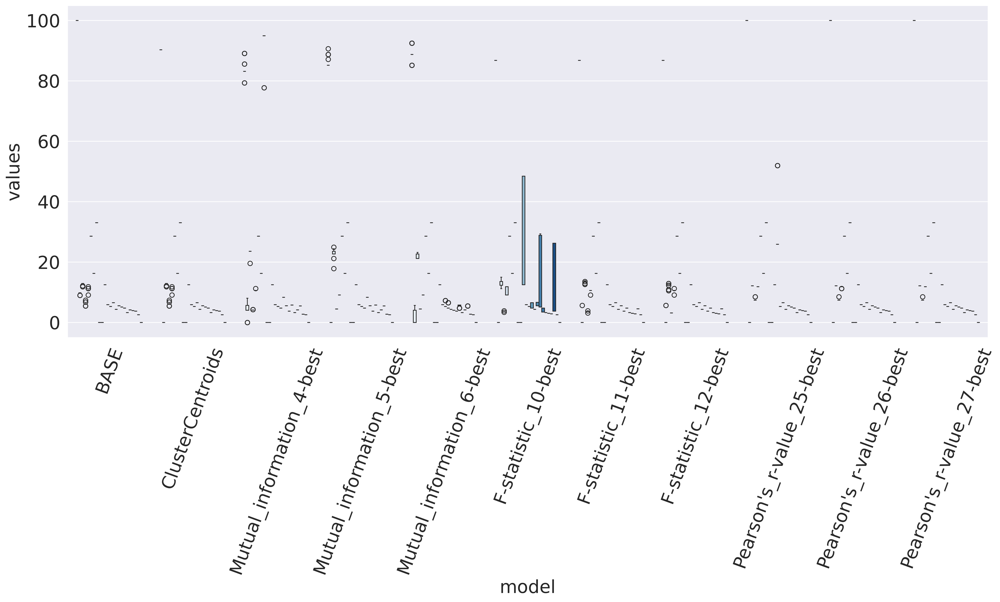

In [34]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_REL_ERROR))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

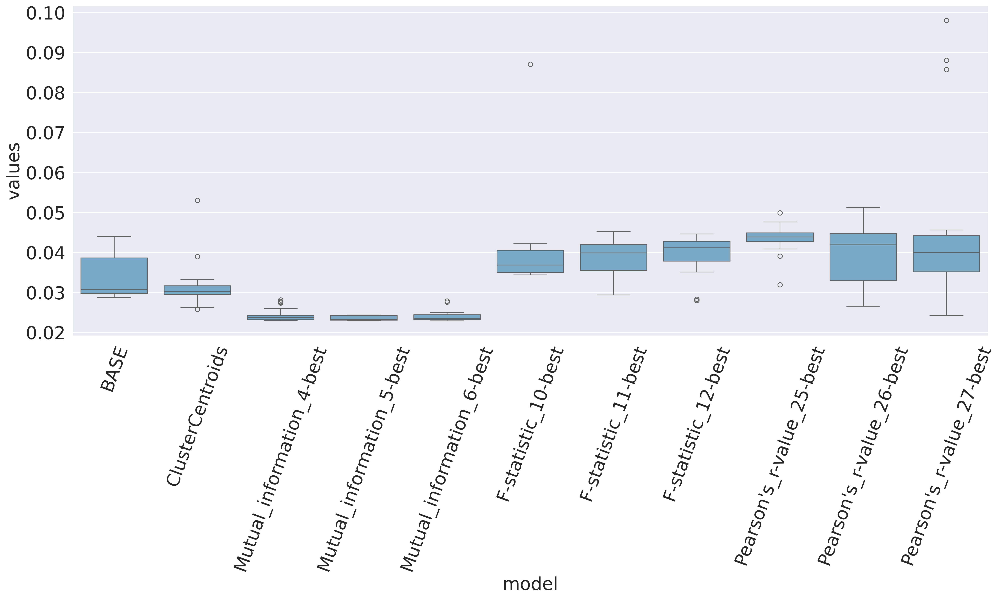

In [35]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

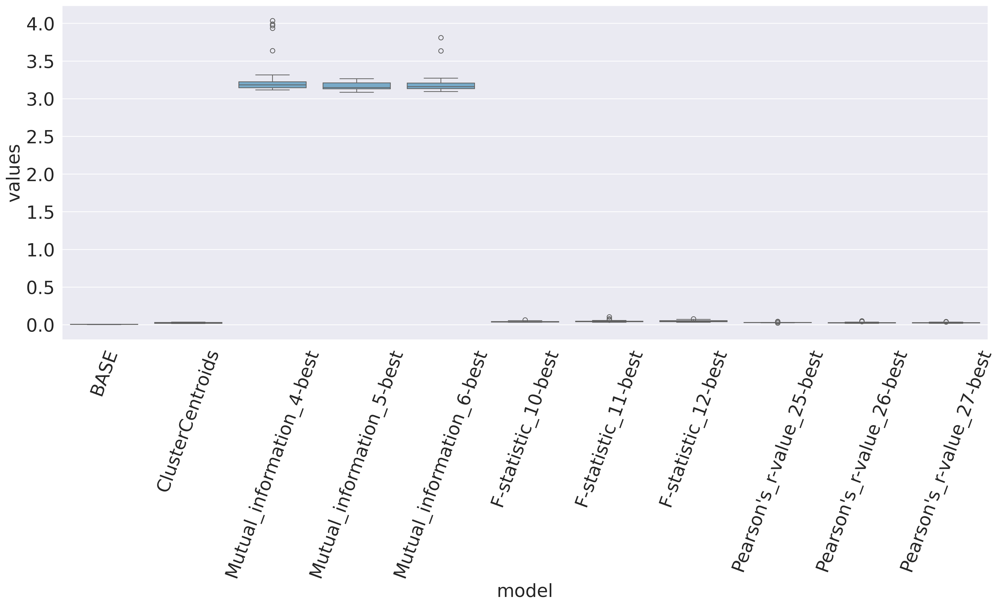

In [36]:
fig = plot_metrics(extract_metrics(results, ["fit_time"]))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

In [37]:
from plot_utils import get_metrics_summary

get_metrics_summary(extract_metrics(results, ["score_time"]))

,,mean,std
model,metrics,,
BASE,score_time,0.033657,0.004848
ClusterCentroids,score_time,0.031249,0.004582
F-statistic_10-best,score_time,0.038986,0.009143
F-statistic_11-best,score_time,0.038923,0.004234
F-statistic_12-best,score_time,0.039985,0.004111
Mutual_information_4-best,score_time,0.024177,0.001517
Mutual_information_5-best,score_time,0.023517,0.000542
Mutual_information_6-best,score_time,0.023944,0.001161
Pearson's_r-value_25-best,score_time,0.043549,0.002879


# ClusterCentroids + Feature Selection

In [38]:
result_file = "30_mixed_regression_AB_cc_featsel.pkl"
result_file = Path(RESULT_PATH, result_file)

In [39]:
from sklearn.preprocessing import OrdinalEncoder
from imblearn.base import FunctionSampler
from pipe_utils import resampling

estimator = KNeighborsRegressor(n_neighbors=1, leaf_size=1)

models = [
    [(f"BASE", build_pipeline())],
    [(f"ClusterCentroids", build_sampled_pipeline(sampler, estimator))],
]

m_reg = ("Mutual_information", mutual_info_regression, [4, 5, 6])
f_reg = ("F-statistic", f_regression, [12, 13, 14])
r_reg = ("Pearson's_r-value", r_regression, [25, 26, 27])

for name, scorer, npt in [
    m_reg,
    f_reg,
    r_reg,
]:
    for k in npt:
        fs = SelectKBest(score_func=scorer, k=k)

        sampler = ClusterCentroids(
            estimator=KMeans(n_init="auto"),
            sampling_strategy=strgy,
            random_state=random_state,
        )

        estimator = KNeighborsRegressor(n_neighbors=1)

        pipeline = Pipeline(
            [
                (
                    "sampler",
                    FunctionSampler(
                        func=resampling, kw_args=dict(sampler=sampler), validate=False
                    ),
                ),
                ("featsel", fs),
                ("estimator", estimator),
            ],
            verbose=False,
        )
        models.append([(f"{name}_{k}-best", pipeline)])

In [40]:
scoring = get_real_regression_scoring()

start_time = time.perf_counter()
results = conduct_ab_mixed_reg_experiment(
    Xsyn=Xsyn,
    ysyn=ysyn,
    Xreal=Xreal,
    yreal=yreal,
    estimators=models,
    n_splits=32,
    test_size=0.1,
    scoring=scoring,
    random_state=random_state,
)
end_time = time.perf_counter()
print(f"time passed: {end_time-start_time:.2f} s")

time passed: 98.29 s

## Store results for later

In [41]:
results.to_pickle(result_file)

## Plot some results for overview

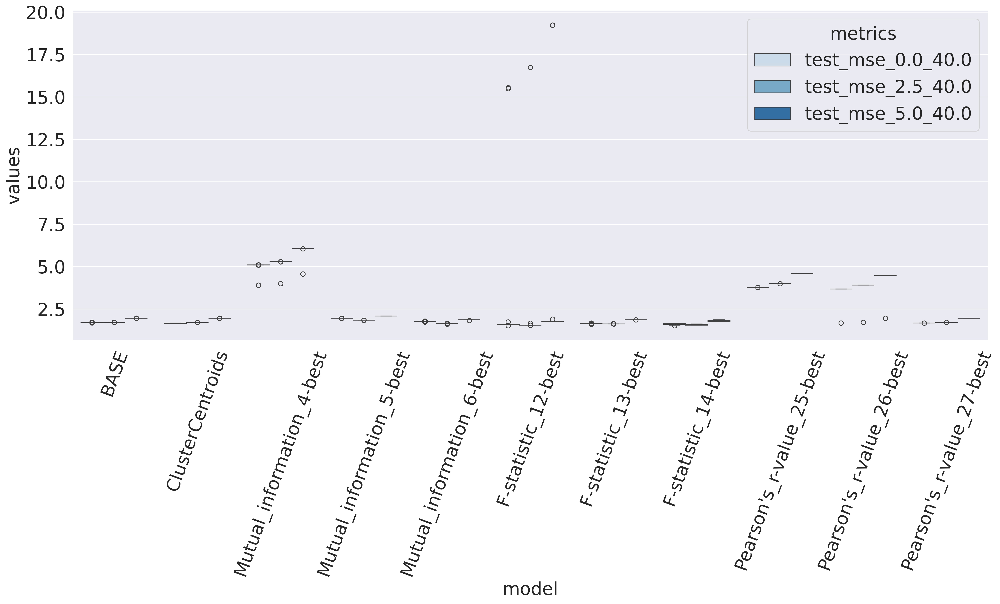

In [42]:
fig = plot_metrics(
    extract_metrics(
        results, ["test_mse_0.0_40.0", "test_mse_2.5_40.0", "test_mse_5.0_40.0"]
    )
)

plt.xticks(rotation=70)
plt.show()

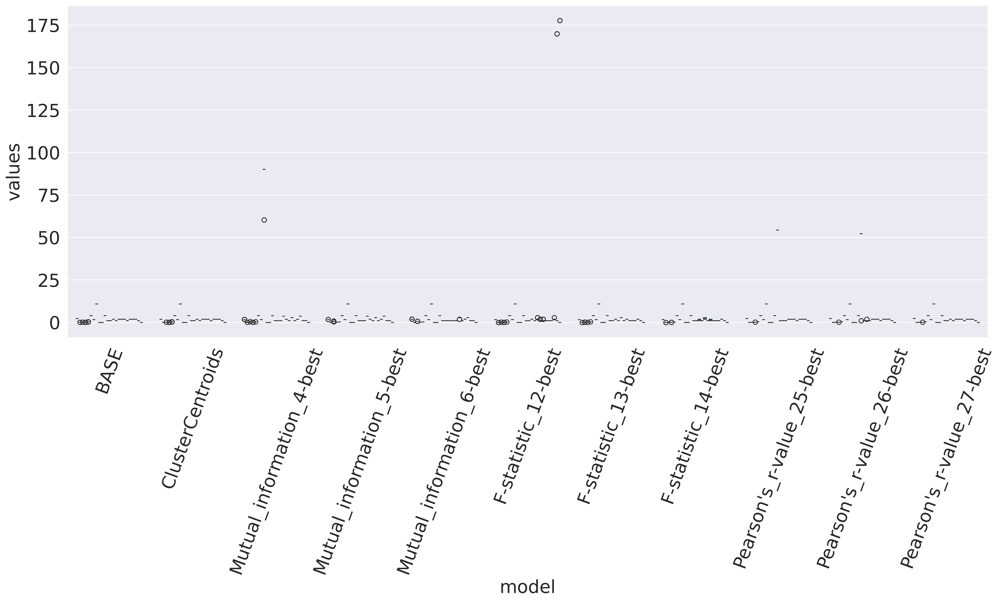

In [43]:
shm_scoring = SHM_Scoring()
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_MSE_RESULTS))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

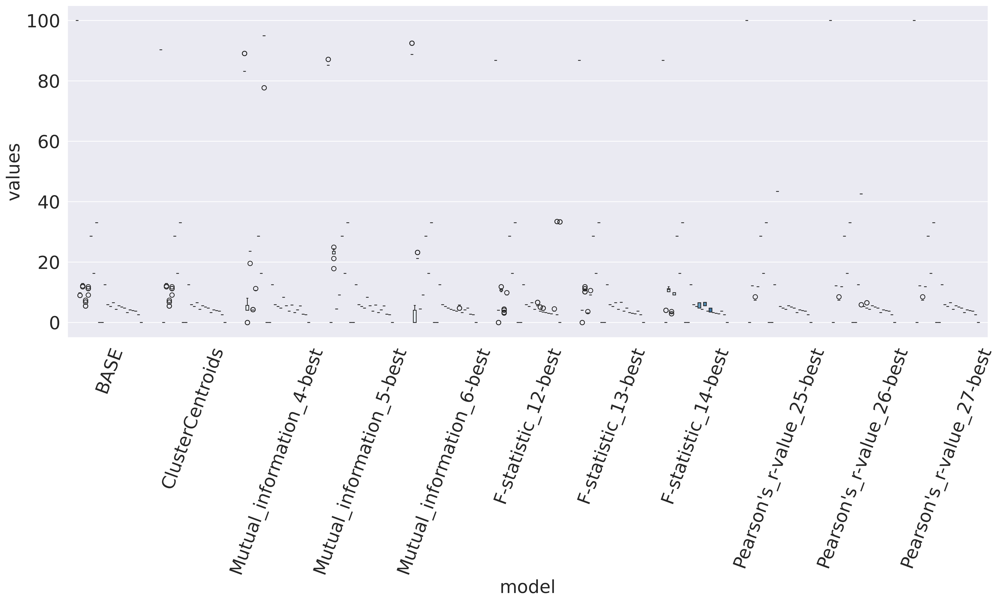

In [44]:
fig = plot_metrics(extract_metrics(results, shm_scoring.REAL_REL_ERROR))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

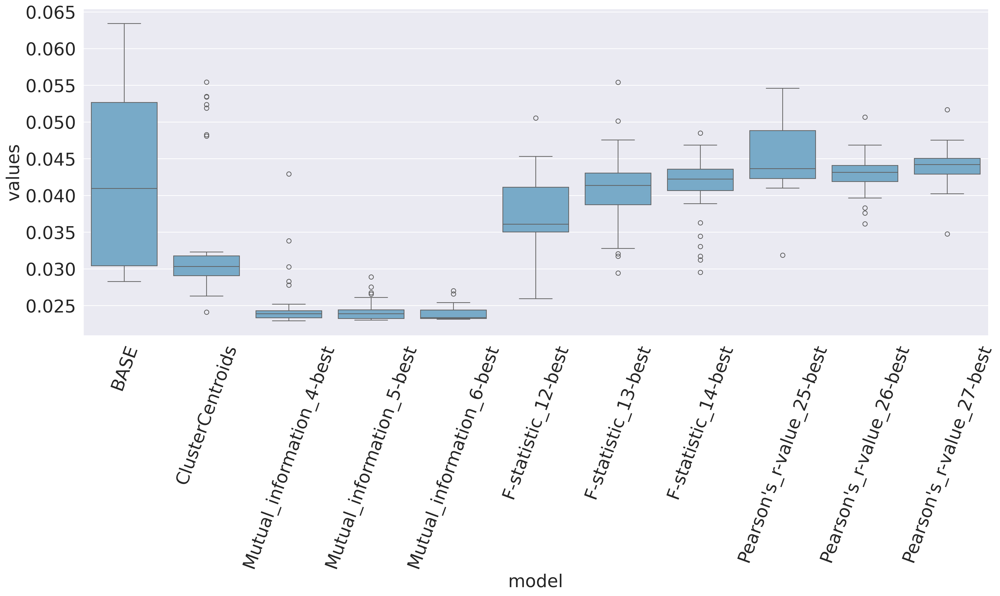

In [45]:
fig = plot_metrics(extract_metrics(results, ["score_time"]))  # "fit_time",
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

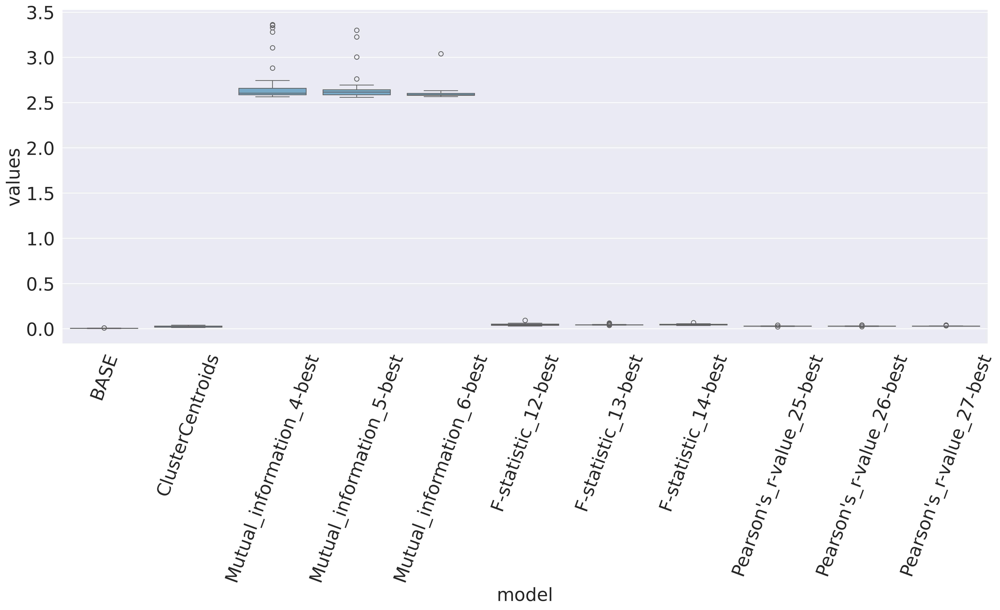

In [46]:
fig = plot_metrics(extract_metrics(results, ["fit_time"]))
plt.gca().get_legend().remove()
plt.xticks(rotation=70)
plt.show()

In [47]:
from plot_utils import get_metrics_summary

get_metrics_summary(extract_metrics(results, ["score_time"]))

,,mean,std
model,metrics,,
BASE,score_time,0.042844,0.011336
ClusterCentroids,score_time,0.034476,0.009554
F-statistic_12-best,score_time,0.037226,0.005589
F-statistic_13-best,score_time,0.040934,0.005219
F-statistic_14-best,score_time,0.041075,0.004580
Mutual_information_4-best,score_time,0.025116,0.004011
Mutual_information_5-best,score_time,0.024296,0.001415
Mutual_information_6-best,score_time,0.023919,0.000981
Pearson's_r-value_25-best,score_time,0.045354,0.005013
